In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
from src.utils.folders_tb import readcsv

ModuleNotFoundError: No module named 'src'

In [3]:
adni = pd.read_csv("../data/MCI_AD_CN_Final.csv", sep=",")
adni.head()

,Subject ID,Phase,Sex,Weight,Research Group,APOE A2,Visit,Study Date,Age,MMSE Total Score,GDSCALE Total Score,Global CDR,Description,Type,Imaging Protocol,Structure
0,002_S_0729,ADNI 2,F,75.3,MCI,4,ADNI2 Year 2 Visit,8/16/2013,72.3,24.0,1.0,1.0,3 Plane Localizer,Original,Acquisition Plane=AXIAL;Weighting=T1,Brain
1,002_S_1070,ADNI 1,M,88.4,MCI,3,ADNI1/GO Month 24,12/11/2008,75.8,19.0,1.0,1.0,3-plane localizer,Original,Acquisition Plane=AXIAL;Weighting=T1,Brain
2,002_S_1070,ADNI 1,M,88.4,MCI,3,ADNI1/GO Month 24,12/11/2008,75.8,19.0,1.0,1.0,SURVEY,Original,Acquisition Plane=AXIAL;Weighting=T1,Brain
3,003_S_4892,ADNI 2,F,81.6,AD,4,ADNI2 Year 1 Visit,9/19/2013,76.3,26.0,4.0,1.0,Calibration Scan,Original,Acquisition Plane=AXIAL;Weighting=T1,Brain
4,003_S_4892,ADNI 2,F,81.6,AD,4,ADNI2 Year 1 Visit,9/19/2013,76.3,26.0,4.0,1.0,3 Plane Localizer,Original,Acquisition Plane=AXIAL;Weighting=T1,Brain


In [4]:
adni.describe()

,Weight,APOE A2,Age,MMSE Total Score,GDSCALE Total Score,Global CDR
count,323.000000,323.000000,323.000000,323.000000,323.000000,323.000000
mean,73.698142,3.653251,77.928793,20.095975,2.386997,1.204334
std,13.187211,0.476674,7.716547,4.828752,1.911574,0.440616
min,36.700000,3.000000,56.200000,0.000000,1.000000,1.000000
25%,65.450000,3.000000,72.350000,17.500000,1.000000,1.000000
50%,73.000000,4.000000,78.800000,21.000000,2.000000,1.000000
75%,81.050000,4.000000,83.850000,24.000000,3.000000,1.000000
max,127.500000,4.000000,92.400000,30.000000,9.000000,3.000000


In [5]:
adni.shape

(323, 16)

### **PRE-PROCESSING**

In [6]:
lista = []
n=1
ul_paciente=None
for paciente in adni["Subject ID"]:
    if ul_paciente != paciente:
        lista.append(paciente)
        n=n+1
    else:
        n=1
print(lista)

['002_S_0729', '002_S_1070', '002_S_1070', '003_S_4892', '003_S_4892', '005_S_0221', '005_S_0222', '005_S_0222', '005_S_0572', '005_S_0572', '005_S_0814', '005_S_0814', '005_S_1341', '005_S_1341', '005_S_4707', '005_S_4707', '006_S_0547', '007_S_0128', '007_S_0249', '007_S_0316', '007_S_1339', '007_S_1339', '009_S_1030', '009_S_1030', '009_S_1030', '009_S_1030', '009_S_5027', '009_S_5027', '009_S_5037', '009_S_5037', '011_S_0003', '011_S_0010', '011_S_0053', '011_S_0053', '011_S_0861', '011_S_1282', '012_S_0689', '012_S_0689', '013_S_0240', '013_S_5071', '016_S_0991', '016_S_0991', '016_S_1117', '016_S_1121', '016_S_1326', '016_S_1326', '016_S_1326', '016_S_4009', '016_S_4009', '016_S_4009', '016_S_4009', '016_S_4591', '016_S_4591', '016_S_4591', '016_S_4591', '016_S_4887', '016_S_4887', '016_S_5032', '016_S_5032', '016_S_5032', '018_S_0142', '018_S_0633', '018_S_0633', '018_S_0682', '018_S_0682', '019_S_4549', '019_S_5019', '021_S_0332', '021_S_0626', '021_S_0753', '021_S_0753', '021_

In [7]:
adni["Visit"].value_counts()

ADNI1/GO Month 24     105
ADNI2 Year 1 Visit     92
ADNI1/GO Month 12      74
ADNI2 Year 2 Visit     31
ADNI2 Year 3 Visit     12
ADNI2 Year 4 Visit      9
Name: Visit, dtype: int64

In [8]:
#I have wanted to give to the dataframe the importance of visits. It's high number when the disease is more serious.
adni['Visits_numbering'] = adni["Visit"].map({"ADNI1/GO Month 12":4, "ADNI1/GO Month 24":6,'ADNI2 Year 1 Visit':6.5,'ADNI2 Year 2 Visit':7,'ADNI2 Year 3 Visit':8,'ADNI2 Year 4 Visit':9})
adni.head(1)

,Subject ID,Phase,Sex,Weight,Research Group,APOE A2,Visit,Study Date,Age,MMSE Total Score,GDSCALE Total Score,Global CDR,Description,Type,Imaging Protocol,Structure,Visits_numbering
0,002_S_0729,ADNI 2,F,75.3,MCI,4,ADNI2 Year 2 Visit,8/16/2013,72.3,24.0,1.0,1.0,3 Plane Localizer,Original,Acquisition Plane=AXIAL;Weighting=T1,Brain,7.0


In [9]:
#Quería añadir una columna con las visitas que tuviera el paciente por cada tipo de prueba que tuviera
tests = []
n=1
for paciente in adni["Structure"]:
    if paciente == "Brain":
        tests.append(1)
print(tests)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


In [10]:
adni["Visits"] = tests
adni.head()

,Subject ID,Phase,Sex,Weight,Research Group,APOE A2,Visit,Study Date,Age,MMSE Total Score,GDSCALE Total Score,Global CDR,Description,Type,Imaging Protocol,Structure,Visits_numbering,Visits
0,002_S_0729,ADNI 2,F,75.3,MCI,4,ADNI2 Year 2 Visit,8/16/2013,72.3,24.0,1.0,1.0,3 Plane Localizer,Original,Acquisition Plane=AXIAL;Weighting=T1,Brain,7.0,1
1,002_S_1070,ADNI 1,M,88.4,MCI,3,ADNI1/GO Month 24,12/11/2008,75.8,19.0,1.0,1.0,3-plane localizer,Original,Acquisition Plane=AXIAL;Weighting=T1,Brain,6.0,1
2,002_S_1070,ADNI 1,M,88.4,MCI,3,ADNI1/GO Month 24,12/11/2008,75.8,19.0,1.0,1.0,SURVEY,Original,Acquisition Plane=AXIAL;Weighting=T1,Brain,6.0,1
3,003_S_4892,ADNI 2,F,81.6,AD,4,ADNI2 Year 1 Visit,9/19/2013,76.3,26.0,4.0,1.0,Calibration Scan,Original,Acquisition Plane=AXIAL;Weighting=T1,Brain,6.5,1
4,003_S_4892,ADNI 2,F,81.6,AD,4,ADNI2 Year 1 Visit,9/19/2013,76.3,26.0,4.0,1.0,3 Plane Localizer,Original,Acquisition Plane=AXIAL;Weighting=T1,Brain,6.5,1


In [11]:
#Eliminate some columns are not necessary to study
adni = adni.drop(["Type", "Imaging Protocol", "Structure"], axis=1)
adni.head()

,Subject ID,Phase,Sex,Weight,Research Group,APOE A2,Visit,Study Date,Age,MMSE Total Score,GDSCALE Total Score,Global CDR,Description,Visits_numbering,Visits
0,002_S_0729,ADNI 2,F,75.3,MCI,4,ADNI2 Year 2 Visit,8/16/2013,72.3,24.0,1.0,1.0,3 Plane Localizer,7.0,1
1,002_S_1070,ADNI 1,M,88.4,MCI,3,ADNI1/GO Month 24,12/11/2008,75.8,19.0,1.0,1.0,3-plane localizer,6.0,1
2,002_S_1070,ADNI 1,M,88.4,MCI,3,ADNI1/GO Month 24,12/11/2008,75.8,19.0,1.0,1.0,SURVEY,6.0,1
3,003_S_4892,ADNI 2,F,81.6,AD,4,ADNI2 Year 1 Visit,9/19/2013,76.3,26.0,4.0,1.0,Calibration Scan,6.5,1
4,003_S_4892,ADNI 2,F,81.6,AD,4,ADNI2 Year 1 Visit,9/19/2013,76.3,26.0,4.0,1.0,3 Plane Localizer,6.5,1


In [12]:
#I want to drop only Research Group CN because only we have 15 registers and I want to normalize the dataframe
adni = adni.drop(adni[adni["Research Group"] == "CN"].index)
adni.head()

,Subject ID,Phase,Sex,Weight,Research Group,APOE A2,Visit,Study Date,Age,MMSE Total Score,GDSCALE Total Score,Global CDR,Description,Visits_numbering,Visits
0,002_S_0729,ADNI 2,F,75.3,MCI,4,ADNI2 Year 2 Visit,8/16/2013,72.3,24.0,1.0,1.0,3 Plane Localizer,7.0,1
1,002_S_1070,ADNI 1,M,88.4,MCI,3,ADNI1/GO Month 24,12/11/2008,75.8,19.0,1.0,1.0,3-plane localizer,6.0,1
2,002_S_1070,ADNI 1,M,88.4,MCI,3,ADNI1/GO Month 24,12/11/2008,75.8,19.0,1.0,1.0,SURVEY,6.0,1
3,003_S_4892,ADNI 2,F,81.6,AD,4,ADNI2 Year 1 Visit,9/19/2013,76.3,26.0,4.0,1.0,Calibration Scan,6.5,1
4,003_S_4892,ADNI 2,F,81.6,AD,4,ADNI2 Year 1 Visit,9/19/2013,76.3,26.0,4.0,1.0,3 Plane Localizer,6.5,1


In [13]:
#Now, it isn't showing the CN group
adni["Research Group"].value_counts()

AD     197
MCI    111
Name: Research Group, dtype: int64

In [14]:
#To encode Research Group because is more serious AD Group than MCI Group. The system understands 2 is double and higher than 1
adni['Research_Group_encode'] = adni["Research Group"].map({"AD":2, "MCI":1})
adni.head(1)

,Subject ID,Phase,Sex,Weight,Research Group,APOE A2,Visit,Study Date,Age,MMSE Total Score,GDSCALE Total Score,Global CDR,Description,Visits_numbering,Visits,Research_Group_encode
0,002_S_0729,ADNI 2,F,75.3,MCI,4,ADNI2 Year 2 Visit,8/16/2013,72.3,24.0,1.0,1.0,3 Plane Localizer,7.0,1,1


In [15]:
#I want to encode this column because it is influence for the progress then I include them in the train
adni['gender'] = adni['Sex'].apply(lambda x: 0 if x == "F" else 1)
adni['gender']

0      0
1      1
2      1
3      0
4      0
      ..
318    0
319    0
320    0
321    0
322    1
Name: gender, Length: 308, dtype: int64

In [16]:
#with gender added
adni.head()

,Subject ID,Phase,Sex,Weight,Research Group,APOE A2,Visit,Study Date,Age,MMSE Total Score,GDSCALE Total Score,Global CDR,Description,Visits_numbering,Visits,Research_Group_encode,gender
0,002_S_0729,ADNI 2,F,75.3,MCI,4,ADNI2 Year 2 Visit,8/16/2013,72.3,24.0,1.0,1.0,3 Plane Localizer,7.0,1,1,0
1,002_S_1070,ADNI 1,M,88.4,MCI,3,ADNI1/GO Month 24,12/11/2008,75.8,19.0,1.0,1.0,3-plane localizer,6.0,1,1,1
2,002_S_1070,ADNI 1,M,88.4,MCI,3,ADNI1/GO Month 24,12/11/2008,75.8,19.0,1.0,1.0,SURVEY,6.0,1,1,1
3,003_S_4892,ADNI 2,F,81.6,AD,4,ADNI2 Year 1 Visit,9/19/2013,76.3,26.0,4.0,1.0,Calibration Scan,6.5,1,2,0
4,003_S_4892,ADNI 2,F,81.6,AD,4,ADNI2 Year 1 Visit,9/19/2013,76.3,26.0,4.0,1.0,3 Plane Localizer,6.5,1,2,0


In [17]:
adni.isnull().sum()

Subject ID               0
Phase                    0
Sex                      0
Weight                   0
Research Group           0
APOE A2                  0
Visit                    0
Study Date               0
Age                      0
MMSE Total Score         0
GDSCALE Total Score      0
Global CDR               0
Description              0
Visits_numbering         0
Visits                   0
Research_Group_encode    0
gender                   0
dtype: int64

<AxesSubplot:>

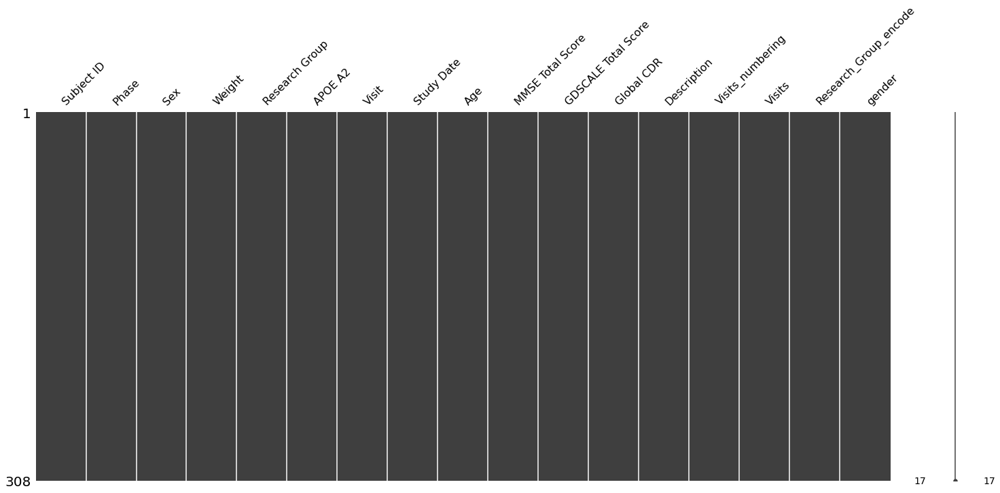

In [18]:
import missingno as msno
msno.matrix(adni)

In [19]:
adni["Phase"].value_counts()

ADNI 1    179
ADNI 2    129
Name: Phase, dtype: int64

In [20]:
adni["MMSE Total Score"].value_counts()

22.0    45
24.0    33
25.0    25
20.0    24
21.0    21
23.0    21
18.0    20
19.0    18
17.0    15
16.0    12
15.0    11
14.0    10
28.0     9
12.0     9
26.0     7
11.0     5
10.0     5
13.0     5
27.0     4
5.0      3
6.0      2
8.0      1
30.0     1
7.0      1
0.0      1
Name: MMSE Total Score, dtype: int64

In [21]:
adni["Global CDR"].value_counts()

1.0    249
2.0     54
3.0      5
Name: Global CDR, dtype: int64

In [22]:
adni["Sex"].value_counts()

M    189
F    119
Name: Sex, dtype: int64

In [23]:
MMSE_propo = (adni["MMSE Total Score"].value_counts() / adni["MMSE Total Score"].value_counts().sum() * 100)
MMSE_propo

22.0    14.610390
24.0    10.714286
25.0     8.116883
20.0     7.792208
21.0     6.818182
23.0     6.818182
18.0     6.493506
19.0     5.844156
17.0     4.870130
16.0     3.896104
15.0     3.571429
14.0     3.246753
28.0     2.922078
12.0     2.922078
26.0     2.272727
11.0     1.623377
10.0     1.623377
13.0     1.623377
27.0     1.298701
5.0      0.974026
6.0      0.649351
8.0      0.324675
30.0     0.324675
7.0      0.324675
0.0      0.324675
Name: MMSE Total Score, dtype: float64

In [24]:
adni["GDSCALE Total Score"].value_counts()

1.0    136
2.0     74
3.0     39
4.0     21
7.0     11
5.0     11
9.0      9
6.0      6
8.0      1
Name: GDSCALE Total Score, dtype: int64

In [25]:
adni["Visits_numbering"].value_counts()

6.0    105
6.5     91
4.0     74
7.0     22
8.0      9
9.0      7
Name: Visits_numbering, dtype: int64

## Analyze by pivoting features

In [26]:
adni.groupby("Subject ID").agg({"Weight": [min, max], "Age": [min, max], "MMSE Total Score": [min, max], "GDSCALE Total Score": [max], "Global CDR": [max], "Visits": [sum], "Visits_numbering": [min, max]})

Weight          Age       MMSE Total Score        \
              min    max   min   max              min   max   
Subject ID                                                    
002_S_0729   75.3   75.3  72.3  72.3             24.0  24.0   
002_S_1070   88.4   88.4  75.8  75.8             19.0  19.0   
003_S_4892   81.6   81.6  76.3  76.3             26.0  26.0   
005_S_0221  110.7  110.7  69.7  69.7             15.0  15.0   
005_S_0222   73.0   74.4  87.1  88.1             23.0  26.0   
...           ...    ...   ...   ...              ...   ...   
141_S_0915   57.6   57.6  86.8  86.8             18.0  18.0   
141_S_0982   88.9   88.9  81.4  81.4             24.0  24.0   
141_S_1004   78.9   78.9  81.1  81.1             17.0  17.0   
141_S_1137   56.7   56.7  82.8  82.8             17.0  17.0   
941_S_1311   60.3   60.3  71.3  71.3             27.0  27.0   

           GDSCALE Total Score Global CDR Visits Visits_numbering       
                           max        max    sum              min  max  
Subject ID                                                              
002_S_0729                 1.0        1.0      1              7.0  7.0  
002_S_1070                 1.0        1.0      2              6.0  6.0  
003_S_4892                 4.0        1.0      2              6.5  6.5  
005_S_0221                 1.0        2.0      1              6.0  6.0  
005_S_0222                 2.0        1.0      2              4.0  6.0  
...                        ...        ...    ...              ...  ...  
141_S_0915                 1.0        3.0      2              6.5  6.5  
141_S_0982                 1.0        1.0      1              4.0  4.0  
141_S_1004                 2.0        2.0      1              7.0  7.0  
141_S_1137                 2.0        2.0      1              4.0  4.0  
941_S_1311                 1.0        1.0      1              6.0  6.0  

[179 rows x 11 columns]

In [27]:
#The first one MMSE is an outlier and it must to drop it
adni.sort_values("MMSE Total Score", ascending=True).head(2)

,Subject ID,Phase,Sex,Weight,Research Group,APOE A2,Visit,Study Date,Age,MMSE Total Score,GDSCALE Total Score,Global CDR,Description,Visits_numbering,Visits,Research_Group_encode,gender
276,128_S_1409,ADNI 1,M,72.1,AD,4,ADNI1/GO Month 24,3/10/2009,67.7,0.0,1.0,2.0,LOC,6.0,1,2,1
165,041_S_1368,ADNI 1,F,68.6,AD,3,ADNI1/GO Month 24,3/16/2009,77.3,5.0,3.0,1.0,localizer,6.0,1,2,0


<AxesSubplot:title={'center':'Outliers'}>

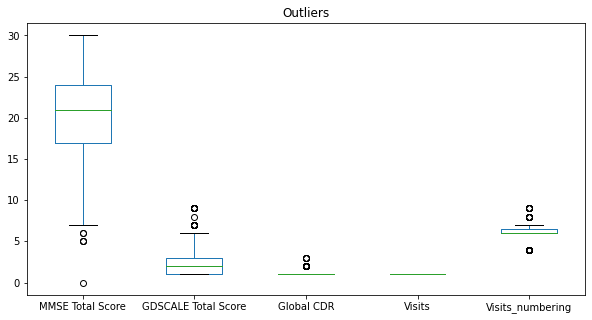

In [28]:
#It is showing the outliers in dataframe
fig, ax = plt.subplots(figsize=(10,5))
ax.set_title('Outliers')
outliers = adni.boxplot(column=["MMSE Total Score", "GDSCALE Total Score", "Global CDR", "Visits", "Visits_numbering"], grid=False)
outliers

In [29]:
#To delete one outliers in MMSE Total Score
print(adni.shape)
adni = adni.drop([276])
adni.shape

(308, 17)


(307, 17)

<AxesSubplot:>

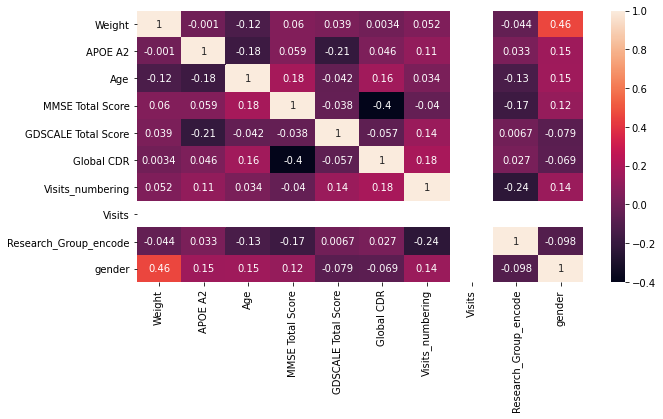

In [30]:
#Age is directly positive correlation with MMSE in 0.19 and CDR in 0.15
fig, ax = plt.subplots(figsize=(10,5)) 
sns.heatmap(adni.corr(), annot=True)

In [31]:
#Althought, there are more male than female. we can see that both catch maxium CDR to 3 points but in MMSE is the male became an higher index with 30 points than female with 28 points. AD is detected earlier with 56  and 57 years old in female and male, respecticly. Furthermore, AD men is keep going in advanced age until 92 and women stops until 89 years old. 
adni.groupby("Sex").agg({"Weight": [min, max], "Age": [min, max], "MMSE Total Score": [min, max], "GDSCALE Total Score": [max], "Global CDR": [max], "Visits": [sum], "Visits_numbering": [min, max]})

Weight          Age       MMSE Total Score       GDSCALE Total Score  \
       min    max   min   max              min   max                 max   
Sex                                                                        
F     36.7   94.3  56.2  89.9              5.0  28.0                 9.0   
M     49.1  127.5  57.5  92.4              6.0  30.0                 9.0   

    Global CDR Visits Visits_numbering       
           max    sum              min  max  
Sex                                          
F          3.0    119              4.0  8.0  
M          3.0    188              4.0  9.0

In [32]:
adni.groupby(["Subject ID", "Sex", "Phase"]).agg({"Weight": [min, max], "Age": [min, max], "MMSE Total Score": [min, max], "GDSCALE Total Score": [max], "Global CDR": [max], "Visits": [sum], "Visits_numbering": [min, max]})

Weight          Age       MMSE Total Score        \
                         min    max   min   max              min   max   
Subject ID Sex Phase                                                     
002_S_0729 F   ADNI 2   75.3   75.3  72.3  72.3             24.0  24.0   
002_S_1070 M   ADNI 1   88.4   88.4  75.8  75.8             19.0  19.0   
003_S_4892 F   ADNI 2   81.6   81.6  76.3  76.3             26.0  26.0   
005_S_0221 M   ADNI 1  110.7  110.7  69.7  69.7             15.0  15.0   
005_S_0222 M   ADNI 1   73.0   74.4  87.1  88.1             23.0  26.0   
...                      ...    ...   ...   ...              ...   ...   
141_S_0915 F   ADNI 2   57.6   57.6  86.8  86.8             18.0  18.0   
141_S_0982 F   ADNI 1   88.9   88.9  81.4  81.4             24.0  24.0   
141_S_1004 F   ADNI 2   78.9   78.9  81.1  81.1             17.0  17.0   
141_S_1137 F   ADNI 1   56.7   56.7  82.8  82.8             17.0  17.0   
941_S_1311 M   ADNI 1   60.3   60.3  71.3  71.3             27.0  27.0   

                      GDSCALE Total Score Global CDR Visits Visits_numbering  \
                                      max        max    sum              min   
Subject ID Sex Phase                                                           
002_S_0729 F   ADNI 2                 1.0        1.0      1              7.0   
002_S_1070 M   ADNI 1                 1.0        1.0      2              6.0   
003_S_4892 F   ADNI 2                 4.0        1.0      2              6.5   
005_S_0221 M   ADNI 1                 1.0        2.0      1              6.0   
005_S_0222 M   ADNI 1                 2.0        1.0      2              4.0   
...                                   ...        ...    ...              ...   
141_S_0915 F   ADNI 2                 1.0        3.0      2              6.5   
141_S_0982 F   ADNI 1                 1.0        1.0      1              4.0   
141_S_1004 F   ADNI 2                 2.0        2.0      1              7.0   
141_S_1137 F   ADNI 1                 2.0        2.0      1              4.0   
941_S_1311 M   ADNI 1                 1.0        1.0      1              6.0   

                            
                       max  
Subject ID Sex Phase        
002_S_0729 F   ADNI 2  7.0  
002_S_1070 M   ADNI 1  6.0  
003_S_4892 F   ADNI 2  6.5  
005_S_0221 M   ADNI 1  6.0  
005_S_0222 M   ADNI 1  6.0  
...                    ...  
141_S_0915 F   ADNI 2  6.5  
141_S_0982 F   ADNI 1  4.0  
141_S_1004 F   ADNI 2  7.0  
141_S_1137 F   ADNI 1  4.0  
941_S_1311 M   ADNI 1  6.0  

[180 rows x 11 columns]

## **EDA by Tableau & Data Vizualization by python**

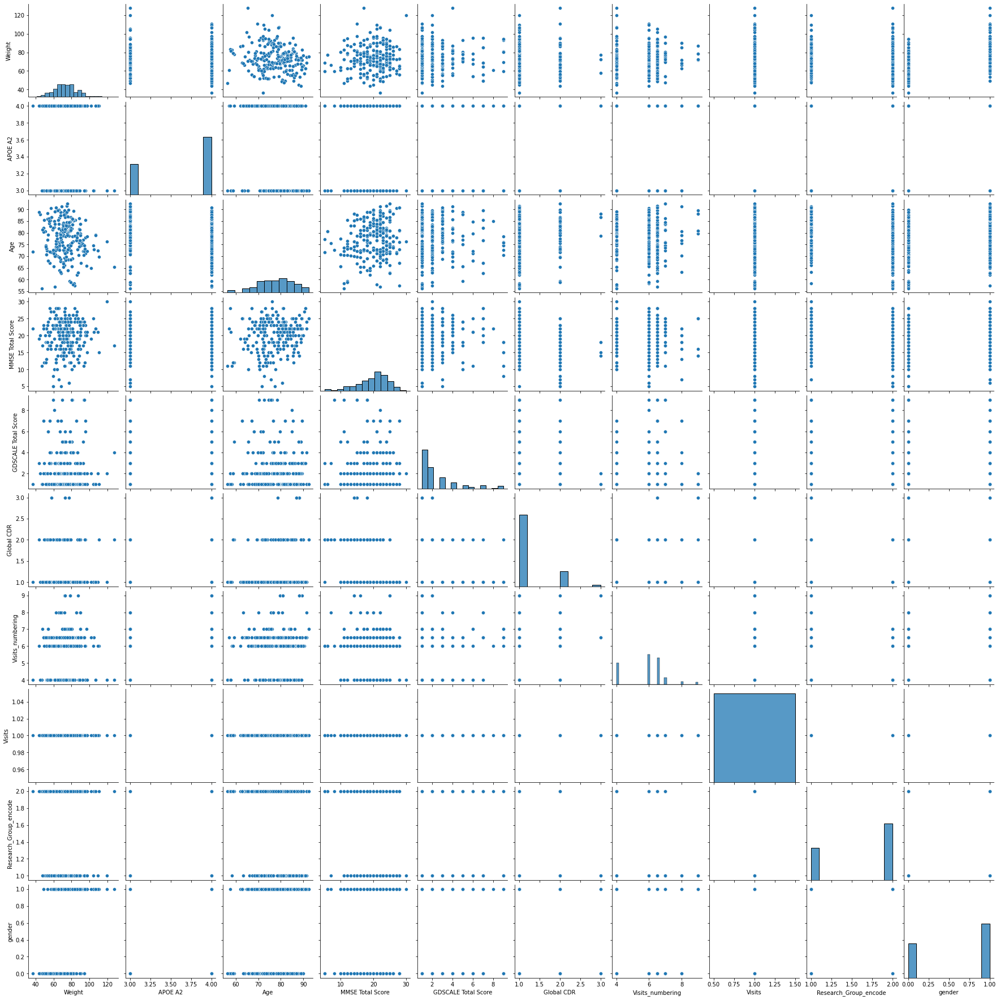

In [33]:
"""HYPOTESIS"""
#It's showing when decrease MMSE (it's probably the patient has AD) is when increase the numbering visit.
#MMSE decrease if your age increase.
sns.pairplot(adni)

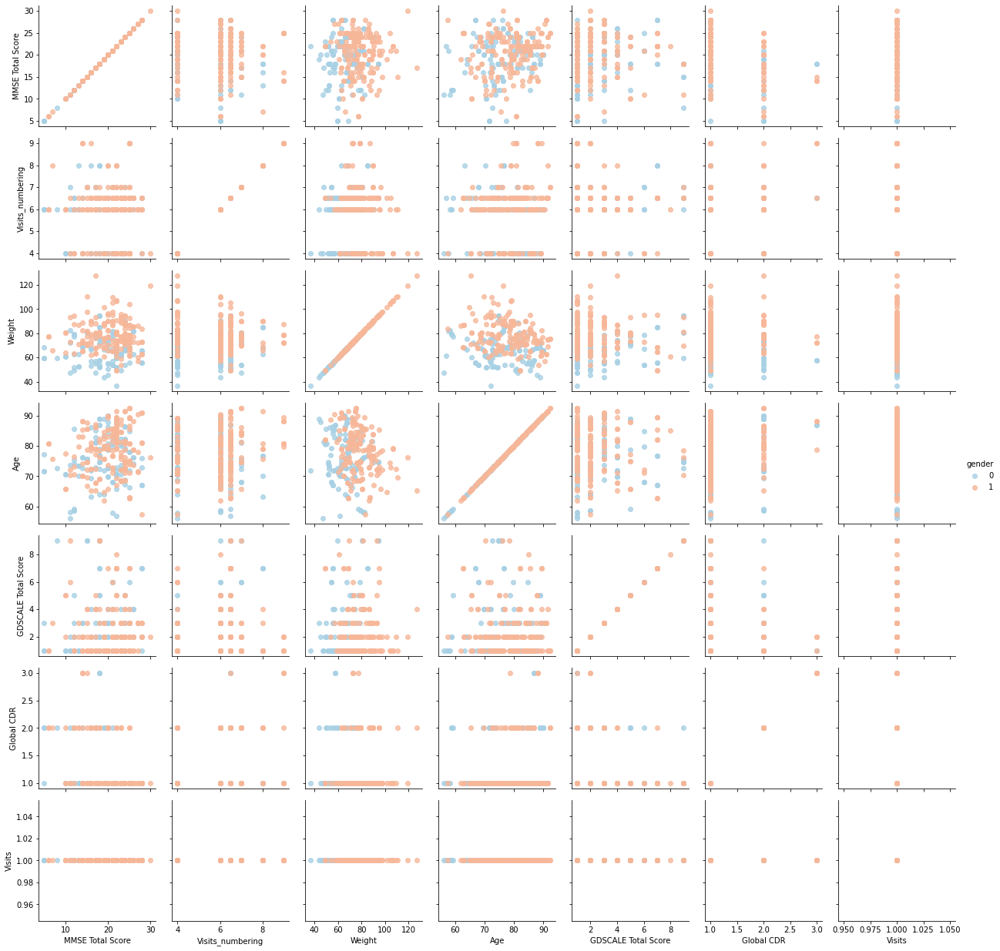

In [34]:
g = sns.PairGrid(adni, vars=['MMSE Total Score', 'Visits_numbering', 'Weight', 'Age', 'GDSCALE Total Score',	'Global CDR', 'Visits'],
                 hue='gender', palette='RdBu_r')
g.map(plt.scatter, alpha=0.8)
g.add_legend()

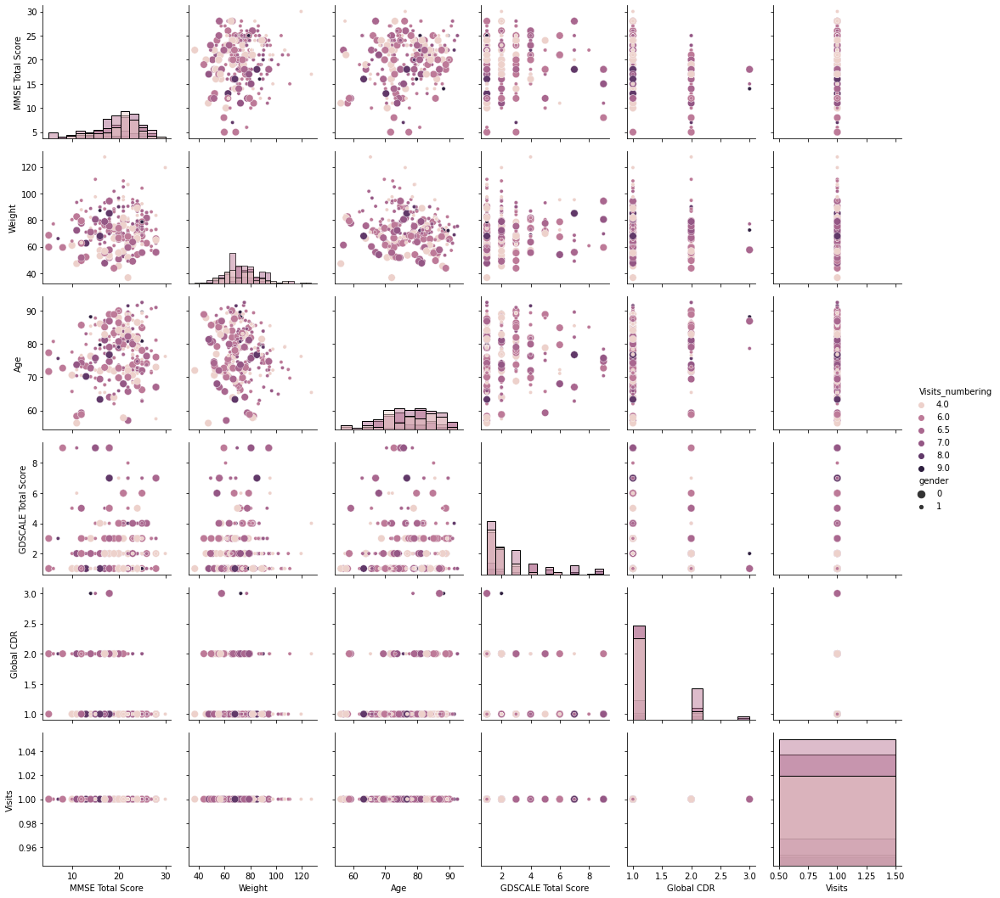

In [35]:
group = sns.PairGrid(adni, vars=['MMSE Total Score', 'Weight', 'Age', 'GDSCALE Total Score',	'Global CDR', 'Visits'], hue='Visits_numbering')
group.map_diag(sns.histplot)
group.map_offdiag(sns.scatterplot, size=adni["gender"])
group.add_legend(title="", adjust_subtitles=True)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


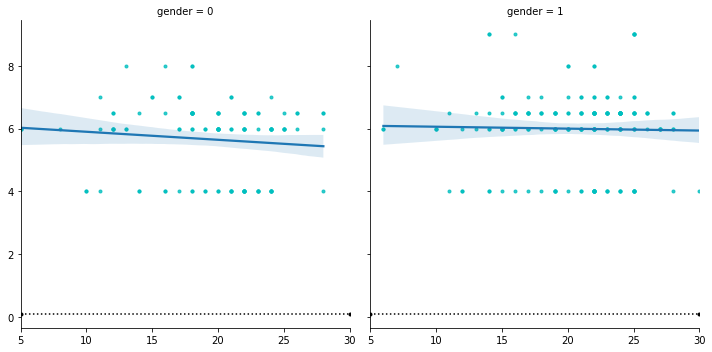

In [36]:
g = sns.lmplot('MMSE Total Score', 'Visits_numbering', col='gender', data=adni,
               markers=".", scatter_kws=dict(color='c'))
g.map(plt.axhline, y=0.1, color="k", ls=":")

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


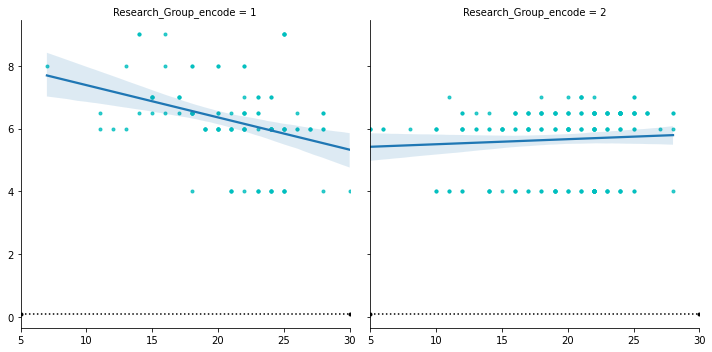

In [37]:
#It'a clear that 
g = sns.lmplot('MMSE Total Score', 'Visits_numbering', col='Research_Group_encode', data=adni,
               markers=".", scatter_kws=dict(color='c'))
g.map(plt.axhline, y=0.1, color="k", ls=":")

In [38]:
gds_vs_sex = adni.pivot_table(columns="GDSCALE Total Score", index="Sex", aggfunc="size")
gds_vs_sex

GDSCALE Total Score,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0
Sex,,,,,,,,,
F,53.0,21.0,19.0,8.0,4.0,4.0,4.0,NaN,6.0
M,82.0,53.0,20.0,13.0,7.0,2.0,7.0,1.0,3.0


array([[<AxesSubplot:title={'center':'1.0'}>,
        <AxesSubplot:title={'center':'2.0'}>,
        <AxesSubplot:title={'center':'3.0'}>],
       [<AxesSubplot:title={'center':'4.0'}>,
        <AxesSubplot:title={'center':'5.0'}>,
        <AxesSubplot:title={'center':'6.0'}>],
       [<AxesSubplot:title={'center':'7.0'}>,
        <AxesSubplot:title={'center':'8.0'}>,
        <AxesSubplot:title={'center':'9.0'}>]], dtype=object)

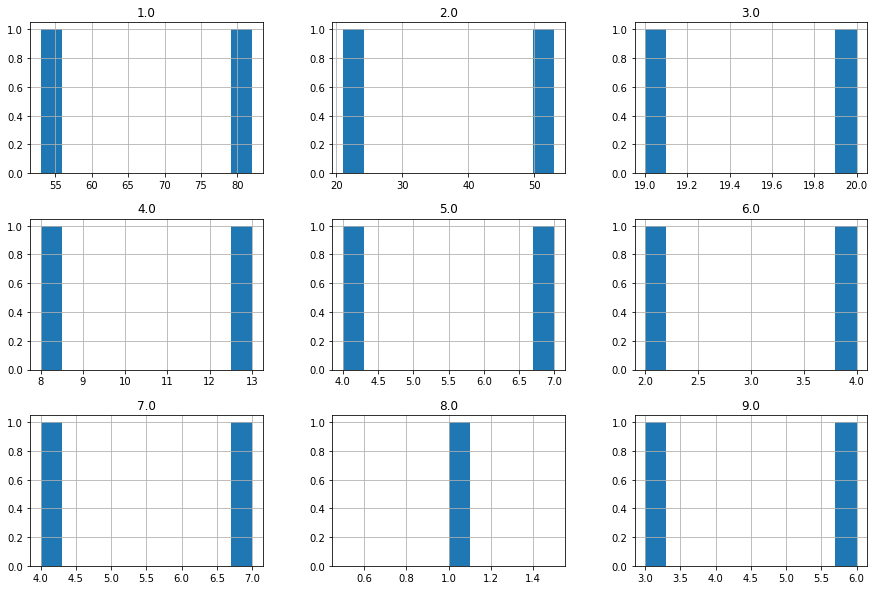

In [39]:
gds_vs_sex.hist(figsize=(15, 10))

<AxesSubplot:ylabel='Frequency'>

<Figure size 1440x1440 with 0 Axes>

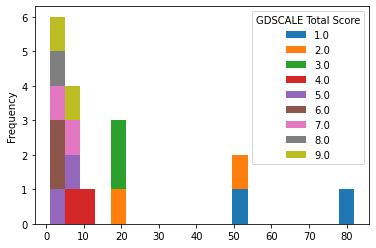

In [40]:
plt.figure(figsize=(20, 20))
gds_vs_sex.plot.hist(stacked=True, bins=20)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='MMSE Total Score', ylabel='Density'>

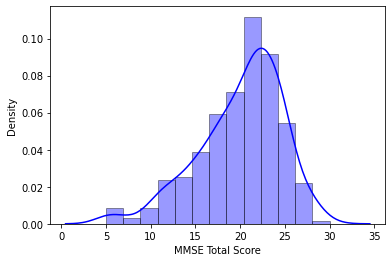

In [41]:
#It's showing which MMSE number has more density. MMSE between 10 and 25 points
sns.distplot(adni['MMSE Total Score'], hist_kws=dict(edgecolor="black", linewidth=1), color='Blue')

<AxesSubplot:xlabel='GDSCALE Total Score'>

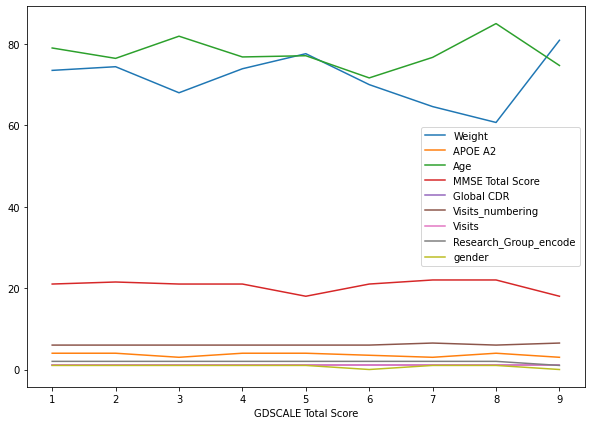

In [42]:
adni.groupby("GDSCALE Total Score").median().plot.line(figsize=(10, 7))

<AxesSubplot:xlabel='Visits_numbering', ylabel='GDSCALE Total Score'>

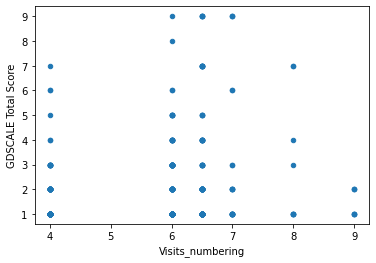

In [43]:
#La mayoría de visitas están concentradas en la 4a, 6a y 7a visita de todo el proceso de AD de un paciente.
adni.plot.scatter(x="Visits_numbering", y="GDSCALE Total Score")

In [44]:
adni.columns

Index(['Subject ID', 'Phase', 'Sex', 'Weight', 'Research Group', 'APOE A2',
       'Visit', 'Study Date', 'Age', 'MMSE Total Score', 'GDSCALE Total Score',
       'Global CDR', 'Description', 'Visits_numbering', 'Visits',
       'Research_Group_encode', 'gender'],
      dtype='object')

<AxesSubplot:xlabel='Visit', ylabel='GDSCALE Total Score'>

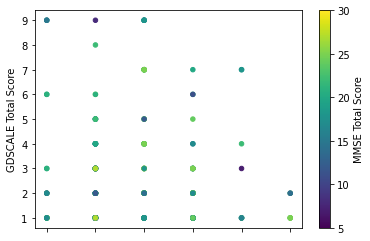

In [45]:
adni.plot.scatter(x="Visit", y="GDSCALE Total Score", c="MMSE Total Score", colormap='viridis')

<AxesSubplot:xlabel='GDSCALE Total Score', ylabel='MMSE Total Score'>

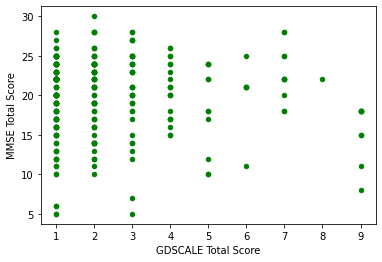

In [46]:
adni.plot.scatter(x="GDSCALE Total Score", y="MMSE Total Score", c="green")

<AxesSubplot:xlabel='Visits_numbering', ylabel='MMSE Total Score'>

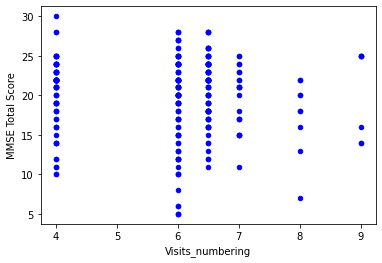

In [47]:
adni.plot.scatter(x="Visits_numbering", y="MMSE Total Score", c="blue")

## **Building, training and fitting the grid model with mae. Predictions**

In [48]:
from sklearn.model_selection import train_test_split


# For Regression ML Models to predict the main metric (first dataset)
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from sklearn import svm
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor

# For Classification of the images
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
# from xgboost import XGBClassifier


from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

# For Cross Validation
from sklearn.model_selection import RepeatedKFold

from sklearn import metrics
from sklearn.metrics import mean_absolute_error

import warnings
warnings.filterwarnings("ignore")


In [49]:
X = np.array(adni[['Weight', 'APOE A2', 'Age', 'GDSCALE Total Score',
       'Global CDR', 'Visits_numbering', 'Visits', 'Research_Group_encode', 'gender']])
X.shape

(307, 9)

In [50]:
y = np.array(adni['MMSE Total Score'])
y.shape

(307,)

## **BASELINE MODEL with GRIDSEARCH**

In [51]:
#This a sample of the dataset to train and fit because it wants to get a baseline model (orientation)
seed_SAMPLE = 34
X_train_SAMPLE, X_test_SAMPLE, y_train_SAMPLE, y_test_SAMPLE = train_test_split(X, y, test_size=0.80, random_state=seed_SAMPLE)

In [52]:
X_train_SAMPLE[0]

array([73.6,  4. , 87.8,  5. ,  1. ,  6. ,  1. ,  1. ,  1. ])

In [53]:
print(X_train_SAMPLE.shape)
print(y_train_SAMPLE.shape)

(61, 9)
(61,)


In [54]:
#This is split with all data of dataset to train and fit
seed = 23
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=seed)

In [55]:
print(X_train.shape)
print(y_train.shape)

(260, 9)
(260,)


In [56]:
pipe = Pipeline(steps=[('classifier', RandomForestRegressor())])
verbose = True

Poly_params = {
    'classifier': [PolynomialFeatures()],
    'classifier__degree': [2]
    }

knn_R_params = {
    'classifier': [KNeighborsRegressor()],
    'classifier__n_neighbors': [7]
    }

Random_Forest_R_params = {
    'classifier': [RandomForestRegressor()],
    'classifier__n_estimators': [10, 50, 100],
    'classifier__verbose': [verbose],
    'classifier__warm_start': [True]
    }

svr_params = {
    'classifier': [svm.SVR()],
    'classifier__kernel':('linear', 'rbf', 'sigmoid'), 
    'classifier__C':[0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9], 
    'classifier__degree': [2],
    'classifier__coef0': [-10.,-1., 0., 0.1, 0.5, 1, 10, 100],
    'classifier__gamma': ('scale', 'auto'),
    'classifier__verbose': [verbose]
    }

search_space = [
    Poly_params,
    knn_R_params,
    Random_Forest_R_params,
    svr_params
    ]

### **BASELINE WITH SOME SAMPLE DATA**
#### The best model is SVR, but the score is worse

In [57]:
%%time

cv = RepeatedKFold(n_splits=30, n_repeats=5, random_state=12)
# Create grid search 
clf_SAMPLE = GridSearchCV(estimator=pipe, param_grid=search_space, cv=cv, verbose=verbose, n_jobs=-1)

# Fit grid search
best_model_SAMPLE = clf_SAMPLE.fit(X_train_SAMPLE, y_train_SAMPLE)

# View best model
separator = "\n############################\n"
print(separator)
print("best estimator:", best_model_SAMPLE.best_estimator_.get_params()['classifier'])
print(separator)
print("clf.best_params_", clf_SAMPLE.best_params_)
print(separator)
# Mean cross-validated score of the best_estimator
print("clf.best_score", clf_SAMPLE.best_score_)

Fitting 150 folds for each of 389 candidates, totalling 58350 fits
[LibSVM]
############################

best estimator: SVR(C=0.9, coef0=-10.0, degree=2, gamma='auto', verbose=True)

############################

clf.best_params_ {'classifier': SVR(C=0.9, coef0=-10.0, degree=2, gamma='auto', verbose=True), 'classifier__C': 0.9, 'classifier__coef0': -10.0, 'classifier__degree': 2, 'classifier__gamma': 'auto', 'classifier__kernel': 'rbf', 'classifier__verbose': True}

############################

clf.best_score -7.003450930978649
CPU times: user 36.3 s, sys: 613 ms, total: 36.9 s
Wall time: 2min 5s


### **BASELINE WITH ALL DATA**
#### The best model is Random Forest Regressor with 29,3% of score and with MAE 1.99, so between 2 numbers up or down between different intervals we have.

In [58]:
%%time
#Now, I need to create the model with GridSearch with all dataset.

cv = RepeatedKFold(n_splits=30, n_repeats=5, random_state=12)
# Create grid search 
clf = GridSearchCV(estimator=pipe, param_grid=search_space, cv=cv, verbose=verbose, n_jobs=-1)

# Fit grid search
best_model = clf.fit(X_train, y_train)

# View best model
separator = "\n############################\n"
print(separator)
print("best estimator:", best_model.best_estimator_.get_params()['classifier'])
print(separator)
print("clf.best_params_", clf.best_params_)
print(separator)
# Mean cross-validated score of the best_estimator
print("clf.best_score", clf.best_score_)

Fitting 150 folds for each of 389 candidates, totalling 58350 fits

############################

best estimator: RandomForestRegressor(verbose=True, warm_start=True)

############################

clf.best_params_ {'classifier': RandomForestRegressor(verbose=True, warm_start=True), 'classifier__n_estimators': 100, 'classifier__verbose': True, 'classifier__warm_start': True}

############################

clf.best_score 0.2938268700563019
CPU times: user 38.6 s, sys: 841 ms, total: 39.4 s
Wall time: 5min 55s
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


In [59]:
y_pred = clf.predict(X_test)
y_pred

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


array([21.76, 23.05, 19.93, 19.68, 17.81, 20.66, 23.6 , 22.29, 15.62,
       15.12, 11.84, 20.75, 18.3 , 20.72, 23.97, 17.05, 18.86, 15.91,
       22.62, 12.34, 17.81, 23.48, 18.48, 24.24, 15.8 , 23.23, 15.57,
       14.62, 17.23, 23.17, 22.29, 19.42, 24.5 , 19.89, 20.63, 12.56,
       22.22, 23.28, 19.82, 22.77, 21.92, 21.34, 21.85, 24.51, 12.63,
       22.16, 23.94])

#### **I have improved this MAE because I deleted one outliers in MMSE feature**

In [60]:
# It needs to know MAE to know which model is better and it gets a minimun error.
print("clf_best_mae", metrics.mean_absolute_error(y_test, y_pred))
# mae de x_test para saber y_pred con y de la label de test
# existe función del mae error

clf_best_mae 1.9970212765957447


In [61]:
import pickle
#SAVE MODEL
# save the model to disk
filename = 'finished_model_ML.sav'
pickle.dump(best_model, open(filename, 'wb'))

In [62]:
# Predictions about data sample
y_train_SAMPLE_predict = clf_SAMPLE.predict(X_train_SAMPLE)
y_train_SAMPLE_predict 

array([21.90004883, 20.38566961, 20.34883226, 20.27657651, 20.31047392,
       21.90006149, 22.90006982, 20.23852154, 23.0618861 , 23.0618861 ,
       20.28722056, 21.90004883, 21.10002044, 21.89998163, 22.15935611,
       22.34693271, 21.68608344, 21.90002045, 19.91428705, 21.90040637,
       19.86566392, 19.3827101 , 20.41970158, 21.96328727, 22.77653095,
       20.27658269, 22.75722218, 20.237667  , 21.97353643, 21.70063969,
       21.84983909, 20.48016973, 20.27588544, 23.33230209, 21.92203803,
       19.96465648, 21.8995496 , 20.9172903 , 22.75083783, 20.18342523,
       20.15755291, 20.69627348, 19.94192894, 21.09979232, 21.90005397,
       20.2766623 , 20.10009159, 21.89995173, 20.55811795, 21.90002045,
       20.27641727, 22.10298843, 21.98399789, 23.23042949, 21.07622253,
       19.90061149, 21.89995173, 21.75553856, 21.72200793, 19.3827101 ,
       22.5379177 ])

## Understand which model is the best with all data

### We have already created a baseline model with sample data and all data. Now, we must understand which model is the best for our supervised regression problem to predict MMSE metric in Alzheimer Disease. Out method will be build to machine learning models and then RNN regression to get a new predict. the type of problem and solution requirement to narrow down to a select few models which we can evaluate. These include:

Dataset to predict MMSE regression: 
- Random Forrest Regressor
- Support Vector Machines Regressor
- Decision Tree Regressor

Dataset to predict class AD/MCI brain image classification:
- Logistic Regression
- KNN or k-Nearest Neighbors
- Support Vector Machines classification
- Random Forest Classification
- Naive Bayes classifier
- RNN Artificial neural network

#### How the best model score and MAE in the GridSearch in my baseline has been Random Forest Regressor, wo it is going to show this model first to know the score MAE.

#### It uses the best n_estimators like baseline and the same seed with all project.

In [82]:
# Random Forest Regressor

rfr = RandomForestRegressor(n_estimators=100, random_state=seed, verbose=True)
# Train the random forest
rfr.fit(X_train, y_train)
# Make predictions and determine the error
y_pred = rfr.predict(X_test)
errors = abs(y_pred - y_test)
# Display the performance metrics
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')
mape = np.mean(100 * (errors / y_test))
accuracy = 100 - mape
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 1.92 degrees.
Accuracy: 88.81 %.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


#### SVR Model is used in baseline with sample data that's why it is important to check in this case with the same parameters that it configurated previously: degree 2 and the best kernel it was "rbf".

In [84]:
# SVM.SVR

svr = svm.SVR(kernel='rbf', gamma='auto', degree=2, verbose=True)
svr.fit(X_train, y_train)
y_pred = svr.predict(X_test)
errors = abs(y_pred - y_test)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')
mape_svr = np.mean(100 * (errors / y_test))
accuracy = 100 - mape_svr
print('Accuracy:', round(accuracy, 2), '%.')

[LibSVM]Mean Absolute Error: 3.03 degrees.
Accuracy: 81.89 %.


#### Decision Tree Regressor is the third model of machine learning to predict the MMSE with the second best MAE in 2.21 degrees

In [85]:
# Decision Tree Regressor

dtr = DecisionTreeRegressor(random_state=seed)
dtr.fit(X_train, y_train)
y_pred = dtr.predict(X_test)
errors = abs(y_pred - y_test)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')
mape_dtr = np.mean(100 * (errors / y_test))
accuracy = 100 - mape_dtr
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 2.21 degrees.
Accuracy: 86.62 %.


In [63]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers

In [64]:
def build_model():
  model = keras.Sequential([
    keras.layers.Dense(32, activation='relu', input_shape=[9]),
    keras.layers.Dropout(0.25),
    keras.layers.Flatten(),
    keras.layers.Dense(24, activation='relu'),
    keras.layers.Dense(9, activation='softmax')
  ])

  optimizer = tf.keras.optimizers.RMSprop(0.001)

  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['accuracy', 'mae', 'mse'])
  return model

In [65]:
model = build_model()

In [66]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32)                320       
_________________________________________________________________
dropout (Dropout)            (None, 32)                0         
_________________________________________________________________
flatten (Flatten)            (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 24)                792       
_________________________________________________________________
dense_2 (Dense)              (None, 9)                 225       
Total params: 1,337
Trainable params: 1,337
Non-trainable params: 0
_________________________________________________________________


In [67]:
history = model.fit(X_train, y_train, epochs=30, validation_split = 0.2, verbose=1)

Epoch 1/30
7/7 [==============================] - 2s 121ms/step - loss: 421.6607 - accuracy: 0.0000e+00 - mae: 19.9212 - mse: 421.6607 - val_loss: 427.4864 - val_accuracy: 0.0000e+00 - val_mae: 20.2543 - val_mse: 427.4864
Epoch 2/30
7/7 [==============================] - 0s 16ms/step - loss: 400.9576 - accuracy: 0.0000e+00 - mae: 19.3102 - mse: 400.9576 - val_loss: 427.4789 - val_accuracy: 0.0000e+00 - val_mae: 20.2543 - val_mse: 427.4789
Epoch 3/30
7/7 [==============================] - 0s 13ms/step - loss: 418.9107 - accuracy: 0.0019 - mae: 19.8317 - mse: 418.9107 - val_loss: 427.5169 - val_accuracy: 0.0000e+00 - val_mae: 20.2543 - val_mse: 427.5169
Epoch 4/30
7/7 [==============================] - 0s 9ms/step - loss: 410.8584 - accuracy: 0.0026 - mae: 19.6811 - mse: 410.8584 - val_loss: 427.5194 - val_accuracy: 0.0000e+00 - val_mae: 20.2543 - val_mse: 427.5194
Epoch 5/30
7/7 [==============================] - 0s 8ms/step - loss: 417.7775 - accuracy: 0.0069 - mae: 19.7880 - mse: 417.

In [68]:
  modelB = keras.Sequential([
    keras.layers.Dense(32, activation='relu', input_shape=[9]),
    keras.layers.Dropout(0.25),
    keras.layers.Flatten(),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(9, activation='softmax')
  ])

modelB.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['mae', 'mse'])

In [69]:
modelB.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 32)                320       
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_5 (Dense)              (None, 9)                 297       
Total params: 1,673
Trainable params: 1,673
Non-trainable params: 0
_________________________________________________________________


In [70]:
history2 = modelB.fit(X_train, y_train, epochs=30, validation_split = 0.2, verbose=1)

Epoch 1/30


InvalidArgumentError:  Received a label value of 28 which is outside the valid range of [0, 9).  Label values: 18 15 22 14 13 17 18 12 28 24 16 18 18 27 17 15 22 28 24 12 14 12 18 17 22 28 19 21 17 14 20 21
	 [[node sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits (defined at <ipython-input-70-6117512bcf3a>:1) ]] [Op:__inference_train_function_3391]

Function call stack:
train_function


In [77]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,accuracy,mae,mse,val_loss,val_accuracy,val_mae,val_mse,epoch
25,416.114685,0.000000,19.731302,416.114685,423.642029,0.0,20.134171,423.642029,25
26,416.117157,0.000000,19.731302,416.117157,423.651398,0.0,20.134171,423.651398,26
27,416.113251,0.004808,19.731302,416.113251,423.653442,0.0,20.134171,423.653442,27
28,416.112457,0.000000,19.731302,416.112457,423.661774,0.0,20.134171,423.661774,28
29,416.109528,0.000000,19.731302,416.109528,423.652039,0.0,20.134171,423.652039,29


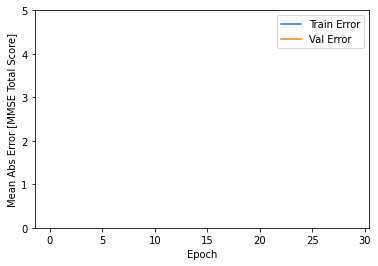

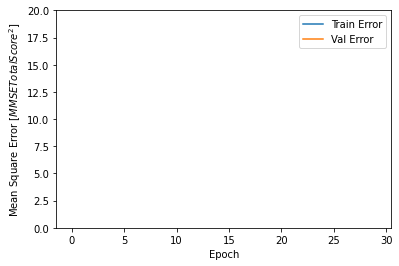

In [78]:
def plot_history(history):
  hist = pd.DataFrame(history.history)
  hist['epoch'] = history.epoch

  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Mean Abs Error [MMSE Total Score]')
  plt.plot(hist['epoch'], hist['mae'],
           label='Train Error')
  plt.plot(hist['epoch'], hist['val_mae'],
           label = 'Val Error')
  plt.ylim([0,5])
  plt.legend()

  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Mean Square Error [$MMSE Total Score^2$]')
  plt.plot(hist['epoch'], hist['mse'],
           label='Train Error')
  plt.plot(hist['epoch'], hist['val_mse'],
           label = 'Val Error')
  plt.ylim([0,20])
  plt.legend()
  plt.show()


plot_history(history)

In [80]:
loss, mae, mse = model.evaluate(X_train, y_train, verbose=2)

print("Testing set Mean Abs Error: {:5.2f} MMSE Total Score".format(mae))

InvalidArgumentError:  Received a label value of 28 which is outside the valid range of [0, 9).  Label values: 20 10 22 26 14 23 14 19 22 23 22 22 21 24 23 24 24 19 12 28 15 24 24 24 22 5 15 23 17 20 25 22
	 [[node sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits (defined at <ipython-input-80-bd385af2c04f>:1) ]] [Op:__inference_test_function_3866]

Function call stack:
test_function


In [ ]:
test_predictions = model.predict(X_train).flatten()

plt.scatter(y_train, y_pred)
plt.xlabel('True Values [MMSE Total Score]')
plt.ylabel('Predictions [MMSE Total Score]')
plt.axis('equal')
plt.axis('square')
plt.xlim([0,plt.xlim()[1]])
plt.ylim([0,plt.ylim()[1]])
_ = plt.plot([-100, 100], [-100, 100])

In [ ]:
error = test_predictions - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Prediction Error [MPG]")
_ = plt.ylabel("Count")